In [27]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.cluster import SpectralClustering
from sklearn.metrics.cluster import silhouette_score
from collections import Counter
from sklearn.decomposition import PCA
import umap
from sklearn.metrics.pairwise import cosine_similarity
import warnings
warnings.filterwarnings("ignore")

In [28]:
X_train = pd.read_csv('data/umist_cropped.csv')
X_train = X_train.to_numpy()

In [29]:
X_train_scaled = X_train/255

### PCA

In [30]:
pca = PCA(n_components=0.995, random_state=123)
X_train_pca = pca.fit_transform(X_train_scaled)

### Spectral_Precomputed

In [31]:
similarity_matrix = cosine_similarity(X_train_pca)
similarity_matrix += 1  # Shift to make all values non-negative
similarity_matrix = (similarity_matrix - similarity_matrix.min()) / (similarity_matrix.max() - similarity_matrix.min())
sil_score_pca_precomputed  = []

# Range of clusters to evaluate
cluster_range = range(10, 25)

# Compute silhouette scores for each number of clusters
for i in cluster_range:
    spectral = SpectralClustering(
        n_clusters=i,
        affinity='precomputed',  # Use precomputed similarity matrix
        assign_labels='kmeans',  # Use KMeans to assign final cluster labels
        random_state=42
    )
    # Fit the model on the similarity matrix
    spectral.fit(similarity_matrix)

    # Access cluster labels from the fitted model
    labels = spectral.labels_

    # Compute silhouette score and append it
    sil_score = silhouette_score(X_train_pca, labels)
    sil_score_pca_precomputed.append(sil_score)

best_clusters_pca_precomputed = cluster_range[np.argmax(sil_score_pca_precomputed)]
best_clusters_index_pca_precomputed = np.argmax(sil_score_pca_precomputed)


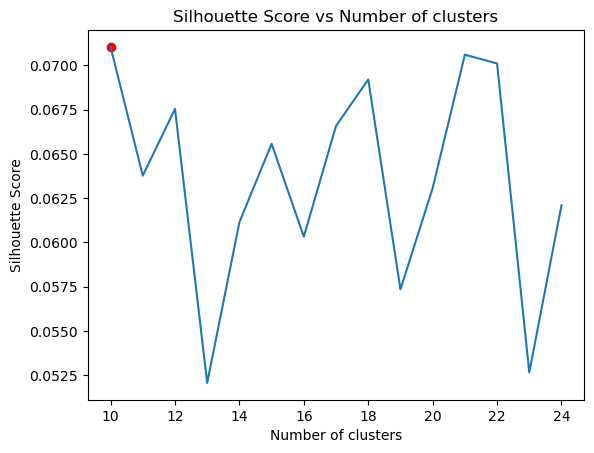

Best number of clusters: 10


In [35]:
plt.plot(cluster_range, sil_score_pca_precomputed)
plt.scatter(cluster_range[best_clusters_index_pca_precomputed], sil_score_pca_precomputed[best_clusters_index_pca_precomputed], color='red')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs Number of clusters')
plt.show()

print(f'Best number of clusters: {best_clusters_pca_precomputed}')

In [34]:
# ### Spectral RBF


# sil_score_pca_rbf = []

# # Range of clusters to evaluate
# cluster_range = range(10, 25)

# # Compute silhouette scores for each number of clusters
# for i in cluster_range:
#     spectral = SpectralClustering(
#         n_clusters=i,
#         affinity='rbf',  # Use precomputed similarity matrix
#         assign_labels='kmeans',  # Use KMeans to assign final cluster labels
#         random_state=42,
        
#     )
#     # Fit the model on the similarity matrix
#     spectral.fit(X_train_pca)

#     # Access cluster labels from the fitted model
#     labels = spectral.labels_

#     # Compute silhouette score and append it
#     sil_score = silhouette_score(X_train_pca, labels)
#     sil_score_pca_rbf.append(sil_score)

# best_clusters_pca_rbf = cluster_range[np.argmax(sil_score_pca_rbf )]
# best_clusters_index_pca_rbf = np.argmax(sil_score_pca_rbf )

KeyboardInterrupt: 

### PCA + UMAP

In [61]:
pca= PCA(n_components=0.995, random_state=42)
pca.fit(X_train_scaled)
num_components = pca.n_components_

reducer = umap.UMAP(n_components = num_components, random_state =42)
X_train_umap = reducer.fit_transform(X_train_scaled)

### Spectral ( Precomputed)

In [40]:
similarity_matrix = cosine_similarity(X_train_umap)

sil_score_umap_precomputed  = []

# Range of clusters to evaluate
cluster_range = range(10, 25)

# Compute silhouette scores for each number of clusters
for i in cluster_range:
    spectral = SpectralClustering(
        n_clusters=i,
        affinity='precomputed',  # Use precomputed similarity matrix
        assign_labels='kmeans',  # Use KMeans to assign final cluster labels
        random_state=42
    )
    # Fit the model on the similarity matrix
    spectral.fit(similarity_matrix)

    # Access cluster labels from the fitted model
    labels = spectral.labels_

    # Compute silhouette score and append it
    sil_score = silhouette_score(X_train_umap, labels)
    sil_score_umap_precomputed.append(sil_score)

best_clusters_umap_precomputed = cluster_range[np.argmax(sil_score_umap_precomputed)]
best_clusters_index_umap_precomputed = np.argmax(sil_score_umap_precomputed)

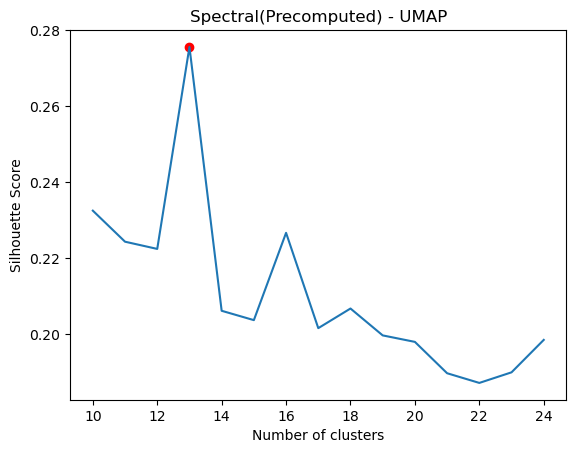

Best number of clusters: 13


In [41]:
plt.plot(cluster_range, sil_score_umap_precomputed)
plt.scatter(cluster_range[best_clusters_index_umap_precomputed], sil_score_umap_precomputed[best_clusters_index_umap_precomputed], color='red')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.title('Spectral(Precomputed) - UMAP')
plt.show()

print(f'Best number of clusters: {best_clusters_umap_precomputed }')

### Spectral ( RBF)

In [42]:
sil_score_umap_rbf = []

# Range of clusters to evaluate
cluster_range = range(10, 25)

# Compute silhouette scores for each number of clusters
for i in cluster_range:
    spectral = SpectralClustering(
        n_clusters=i,
        affinity='rbf',  # Use precomputed similarity matrix
        assign_labels='kmeans',  # Use KMeans to assign final cluster labels
        random_state=42,
        
    )
    # Fit the model on the similarity matrix
    spectral.fit(X_train_umap)

    # Access cluster labels from the fitted model
    labels = spectral.labels_

    # Compute silhouette score and append it
    sil_score = silhouette_score(X_train_umap, labels)
    sil_score_umap_rbf.append(sil_score)

best_clusters_umap_rbf = cluster_range[np.argmax(sil_score_umap_rbf )]
best_clusters_index_umap_rbf = np.argmax(sil_score_umap_rbf )

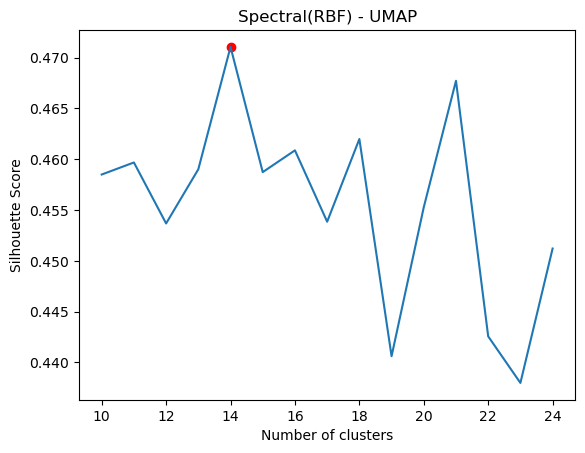

Best number of clusters: 14


In [43]:
plt.plot(cluster_range, sil_score_umap_rbf)
plt.scatter(cluster_range[best_clusters_index_umap_rbf], sil_score_umap_rbf[best_clusters_index_umap_rbf], color='red')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.title('Spectral(RBF) - UMAP')
plt.show()

print(f'Best number of clusters: {best_clusters_umap_rbf }')

In [ ]:
spectral = SpectralClustering(n_clusters=best_clusters_umap_rbf, affinity='rbf', assign_labels='kmeans',  random_state=42,)
spectral.fit(X_train_umap)
spectral_labels = spectral.labels_

### PLot in 2d

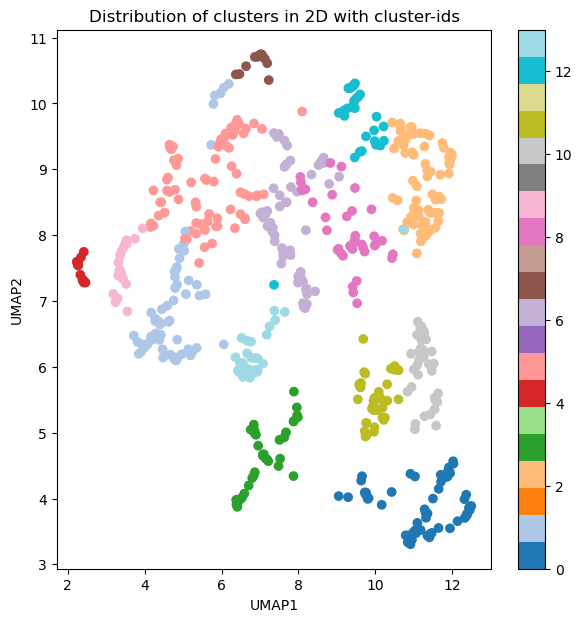

In [47]:
reducer = umap.UMAP(n_components = 2, random_state =42)
embeddings = reducer.fit_transform(X_train_scaled)


plt.figure(figsize=(7, 7))
plt.scatter(embeddings[:, 0], embeddings[:, 1], c=spectral_labels, cmap='tab20')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2') 
plt.title('Distribution of clusters in 2D with cluster-ids')
plt.colorbar()
plt.show()

In [48]:
print(f'Silhouette score: {silhouette_score(X_train_umap, spectral_labels)}')

Silhouette score: 0.4710519313812256


Counter({5: 79, 2: 76, 1: 64, 0: 61, 6: 59, 11: 41, 3: 39, 8: 36, 10: 35, 13: 30, 12: 30, 9: 22, 4: 15, 7: 13})


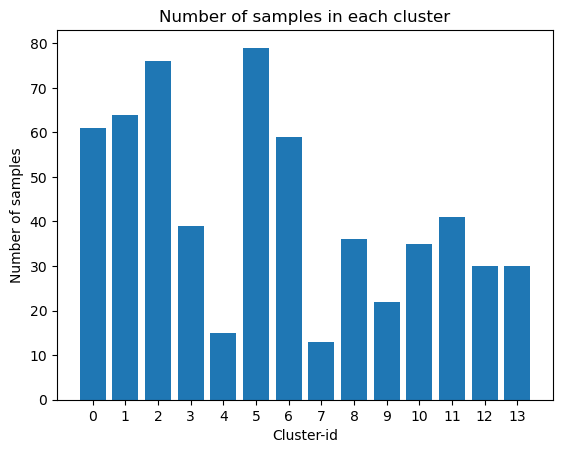

In [50]:
print(Counter(spectral_labels))

plt.bar(Counter(spectral_labels).keys(), Counter(spectral_labels).values())
plt.xlabel('Cluster-id')
plt.ylabel('Number of samples')
plt.title('Number of samples in each cluster')
plt.xticks(range(best_clusters_umap_rbf))
plt.show()

In [51]:
# Plot images of each cluster
umist_data = pd.read_csv("data/umist_cropped.csv")

umist_data['cluster_id'] = spectral_labels

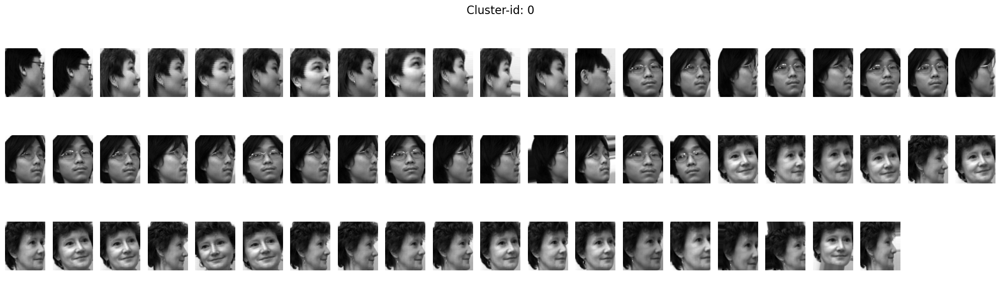

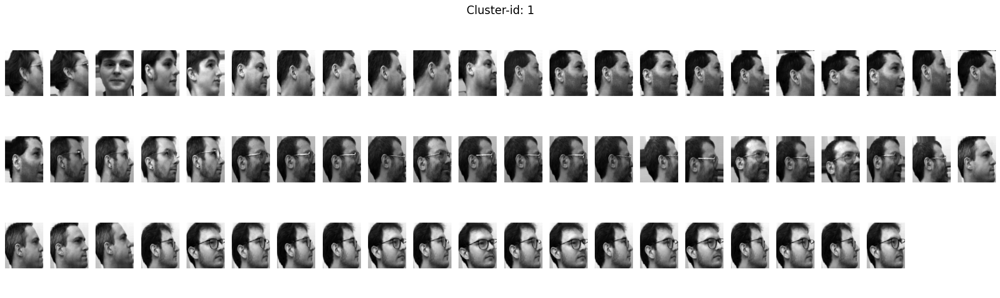

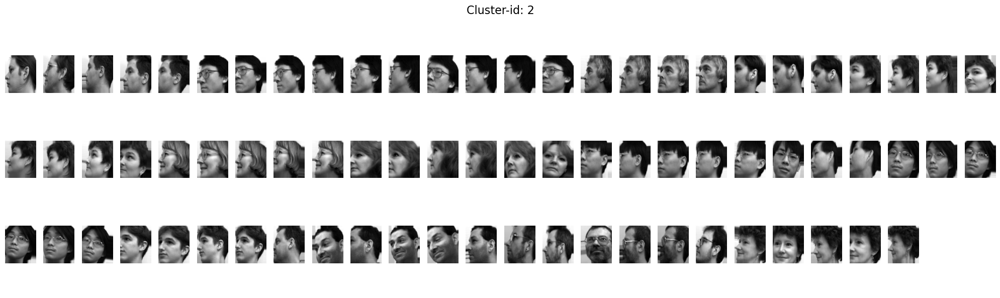

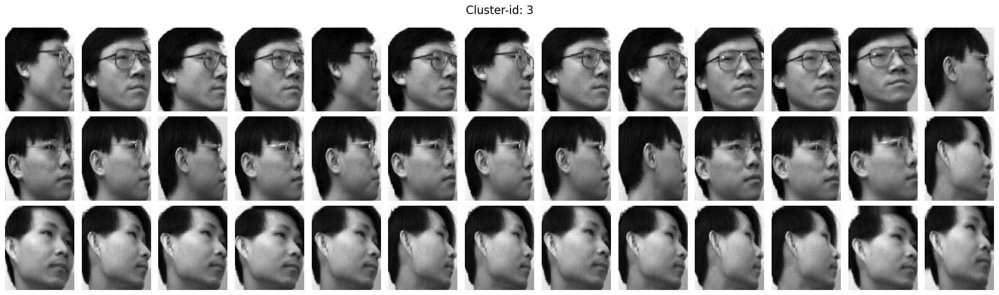

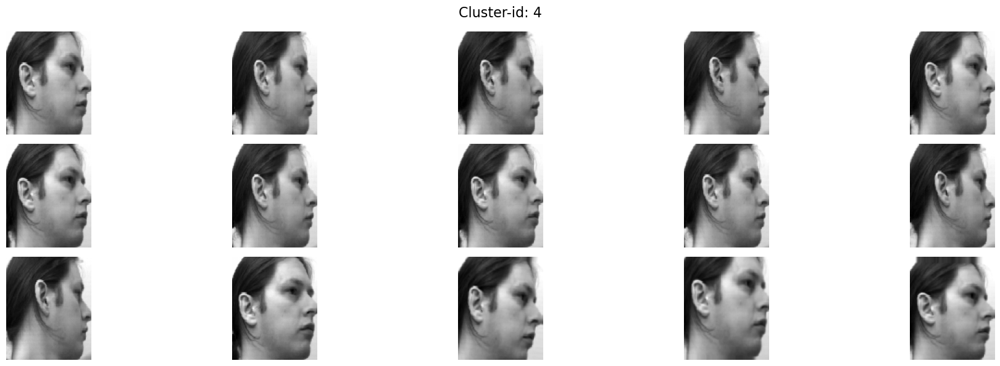

...

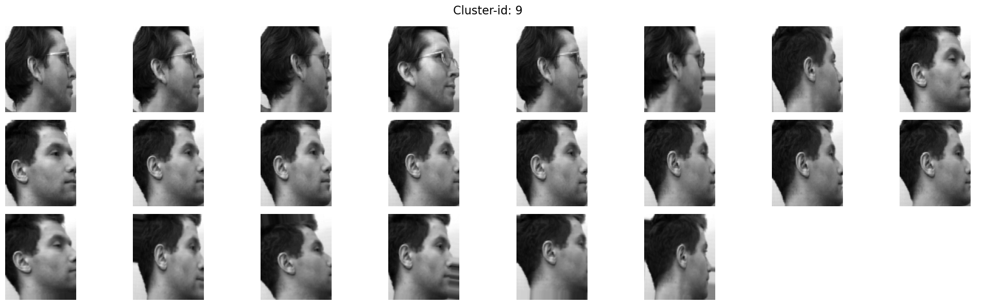

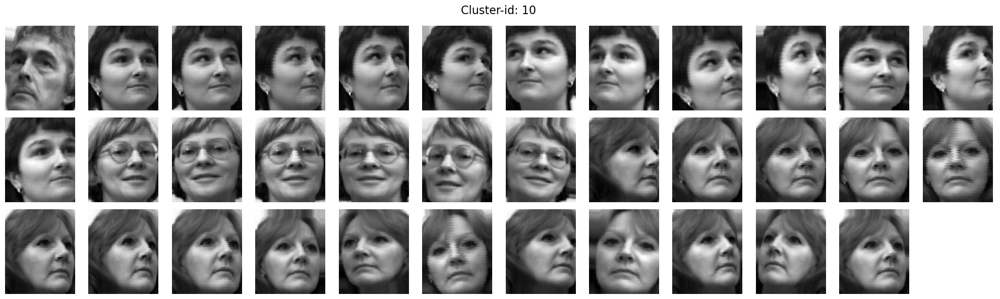

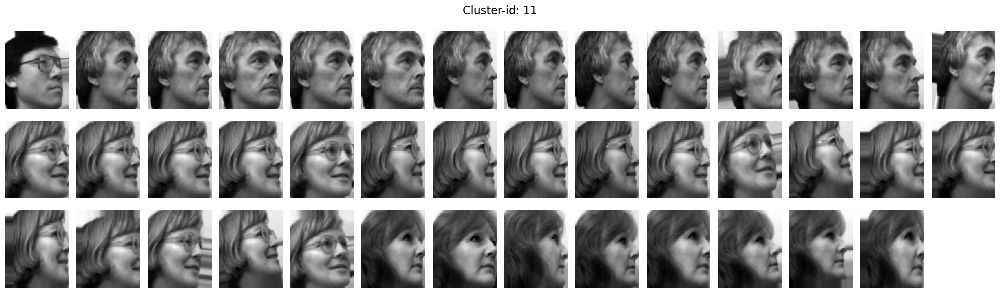

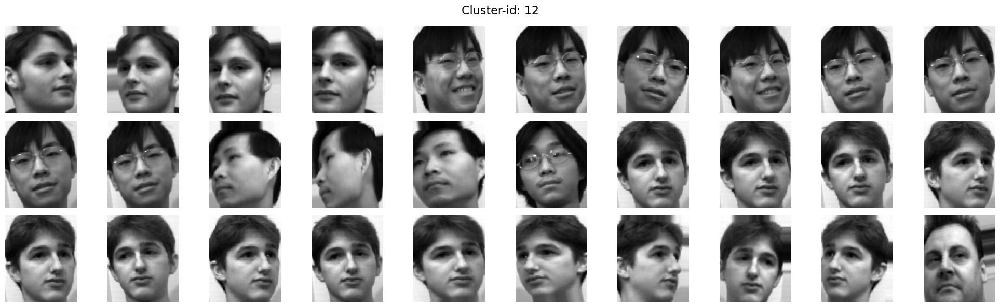

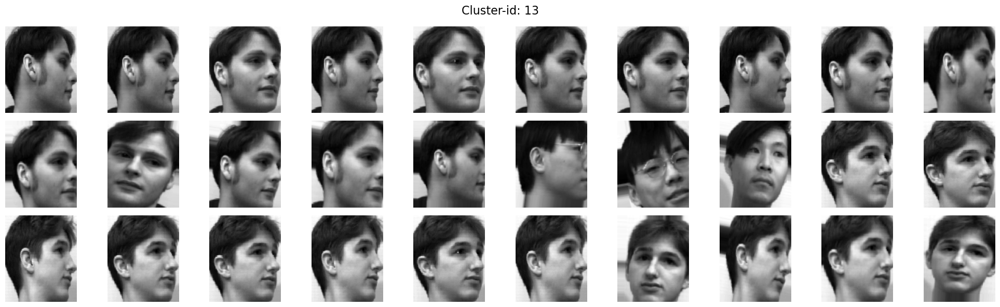

In [52]:
plt_range = None
if 0 not in Counter(labels).keys():
    plt_range = (1, best_clusters_umap_rbf + 1)
else:
    plt_range = (0, best_clusters_umap_rbf)

for cluster_id in range(plt_range[0], plt_range[1]):
    cluster_indices = umist_data[umist_data['cluster_id'] == cluster_id].index
    num_images = min(max(Counter(spectral_labels).values()), len(cluster_indices))
    
    if num_images > 0:
        # Define grid dimensions
        num_rows = 3
        num_cols = (num_images + num_rows - 1) // num_rows  # Ceiling division for columns
        
        fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 6))
        axes = axes.flatten()  # Flatten to handle indexing easily
        
        for i in range(num_rows * num_cols):
            if i < num_images:
                img_idx = cluster_indices[i]
                img = umist_data.iloc[img_idx, :-1].to_numpy().reshape(112, 92)
                
                axes[i].imshow(img, cmap='gray')
                axes[i].axis('off')
            else:
                # Hide unused subplots
                axes[i].axis('off')
        
        plt.suptitle(f'Cluster-id: {cluster_id}', fontsize=16)
        plt.tight_layout()
        plt.show()

#### Apply on Test Set

In [54]:
X_test = pd.read_csv('data/test_data/umist_test.csv')
X_test = X_test.to_numpy()
X_test_scaled = X_test/255

In [62]:

X_test_umap = reducer.transform(X_test_scaled)

In [63]:
from sklearn.metrics.pairwise import rbf_kernel, pairwise_distances_argmin

centroids = np.array([X_train_umap[spectral_labels == i].mean(axis=0) for i in range(best_clusters_umap_rbf)])

# Assign test points to nearest centroid
test_labels = pairwise_distances_argmin(X_test_umap, centroids)

print("Test Set Cluster Labels:", test_labels)

Test Set Cluster Labels: [13  6 11  6  7  5  5  7  9  4  0  6  1  0  3  1 11  5  3  0  3  6  6  1
 13 10  9  1  6 11  1  5 13  0  0 12  3 10  0 12  3  6  3  0  1  0 13  5
  0 11  1  4  0  3  0 13 13 13  9  5 11 10  5  6  7  1 12  0  0  0  3  1
  5  0  5  1  9 11  6  5  1  6  6 13  5 12  5  1  0  1  8  1  0  1  4  5
 10  3 12  6  7  6 10  6  1  1 10  5  1  5  3 11 12]


In [64]:
print(f'Silhouette score: {silhouette_score(X_test_umap, test_labels)}')

Silhouette score: 0.44613155722618103


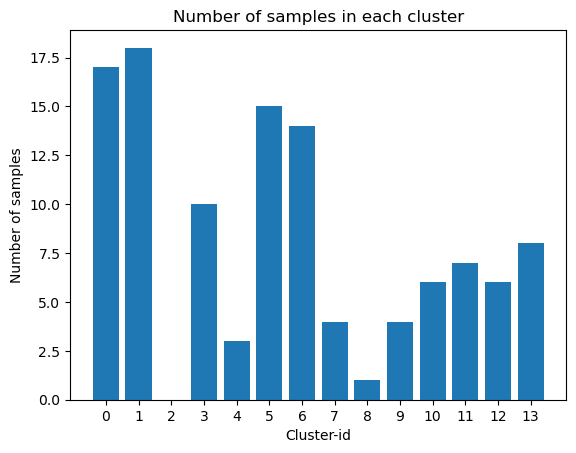

In [66]:


plt.bar(Counter(test_labels).keys(), Counter(test_labels).values())
plt.xlabel('Cluster-id')
plt.ylabel('Number of samples')
plt.title('Number of samples in each cluster')
plt.xticks(range(best_clusters_umap_rbf))
plt.show()

In [67]:
# Plot images of each cluster
umist_data_test = pd.read_csv("data/test_data/umist_test.csv")

umist_data_test['cluster_id'] = test_labels

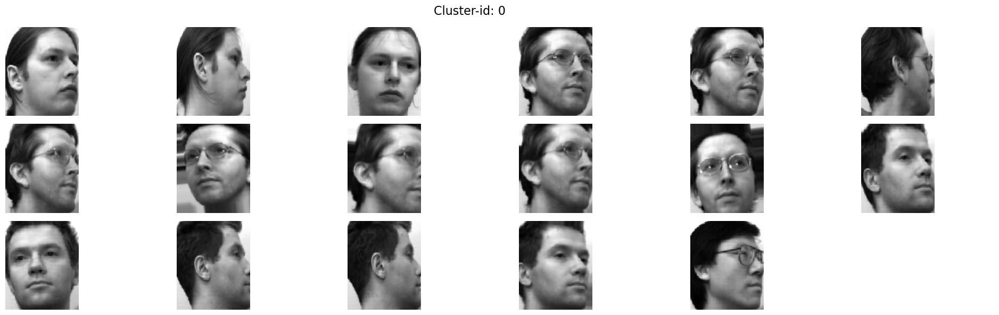

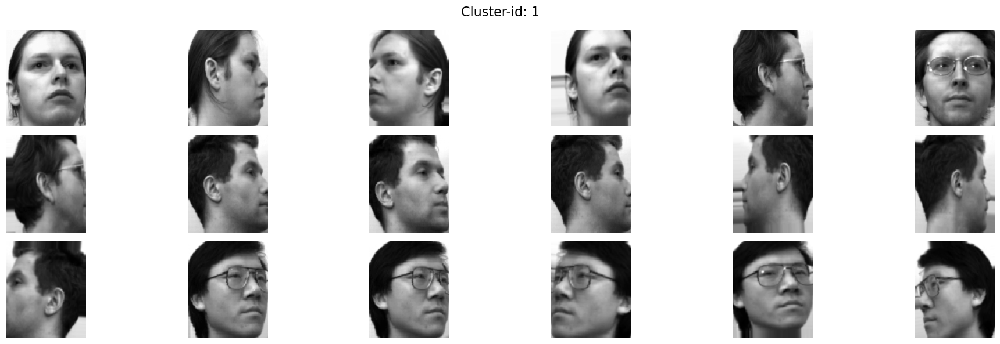

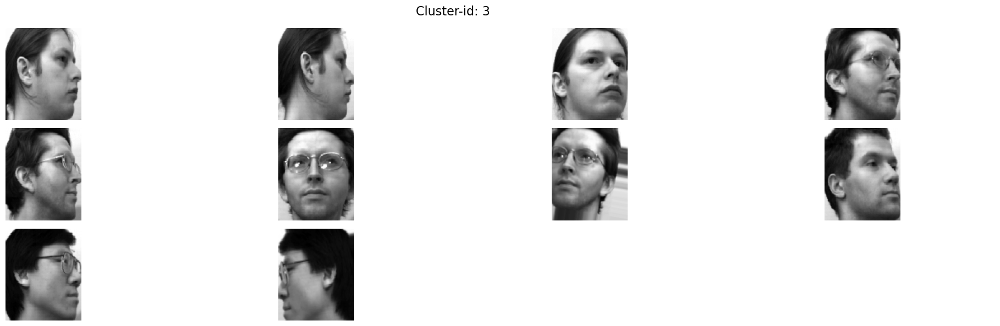

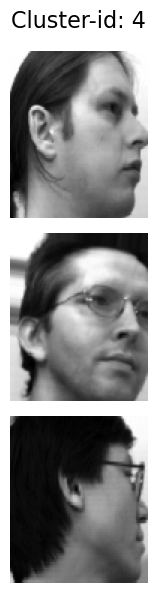

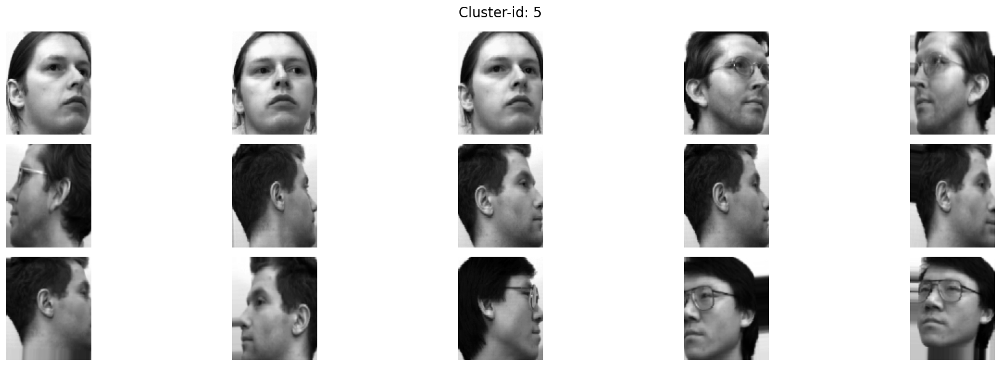

...

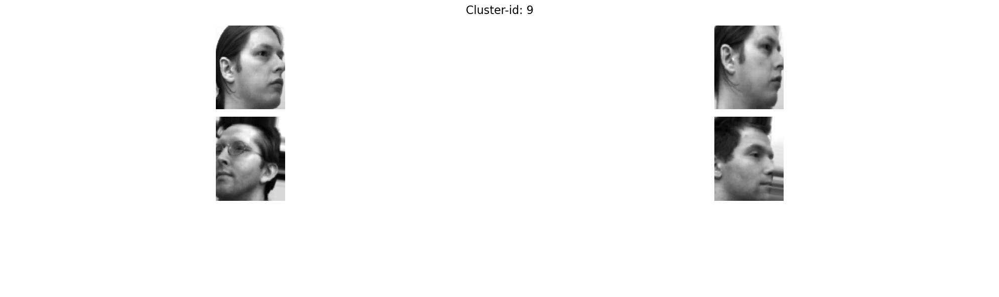

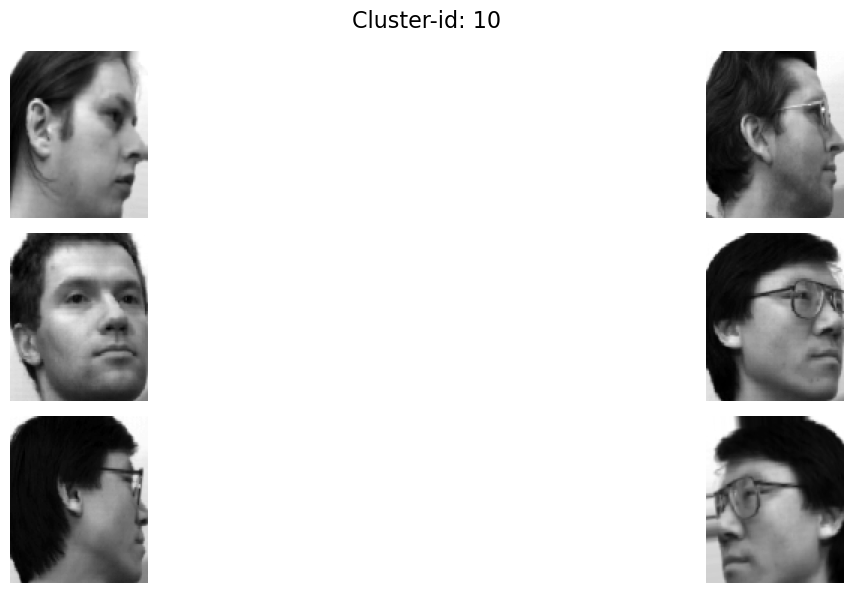

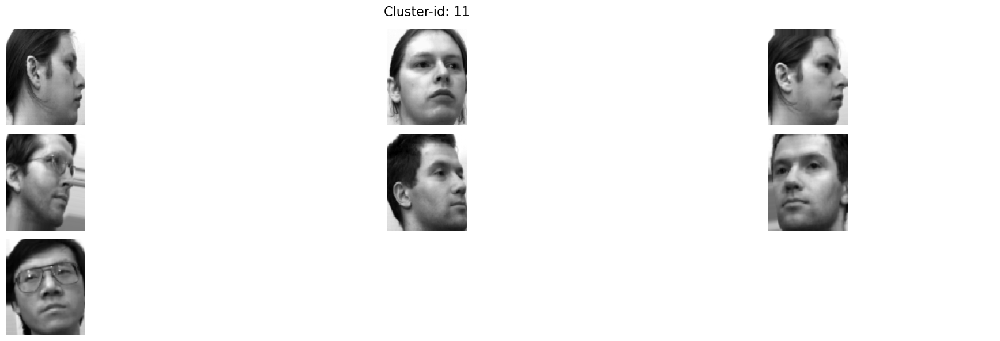

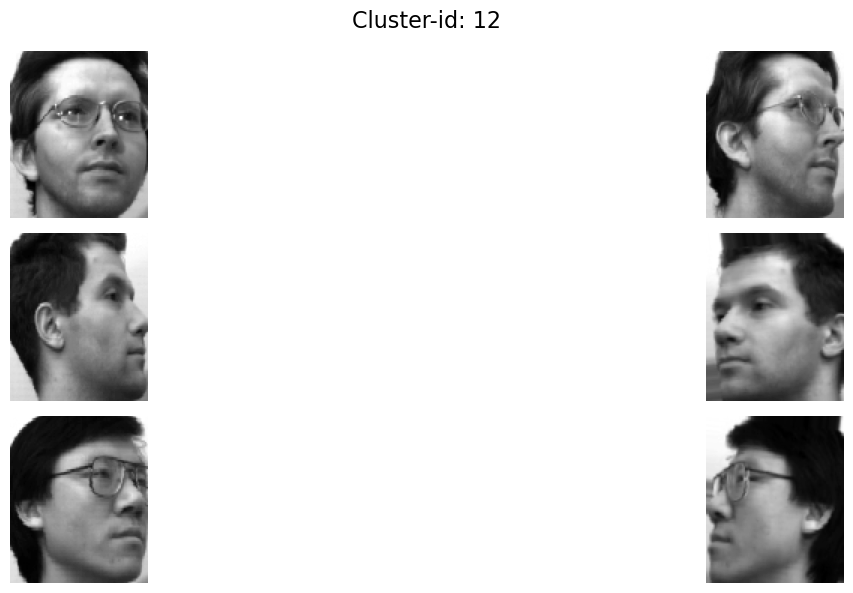

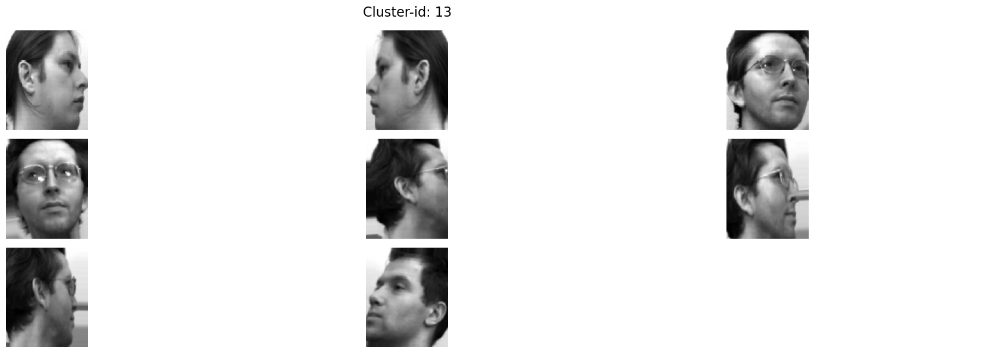

In [68]:
plt_range = None
if 0 not in Counter(labels).keys():
    plt_range = (1, best_clusters_umap_rbf + 1)
else:
    plt_range = (0, best_clusters_umap_rbf)

for cluster_id in range(plt_range[0], plt_range[1]):
    cluster_indices = umist_data_test[umist_data_test['cluster_id'] == cluster_id].index
    num_images = min(max(Counter(test_labels).values()), len(cluster_indices))
    
    if num_images > 0:
        # Define grid dimensions
        num_rows = 3
        num_cols = (num_images + num_rows - 1) // num_rows  # Ceiling division for columns
        
        fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 6))
        axes = axes.flatten()  # Flatten to handle indexing easily
        
        for i in range(num_rows * num_cols):
            if i < num_images:
                img_idx = cluster_indices[i]
                img = umist_data.iloc[img_idx, :-1].to_numpy().reshape(112, 92)
                
                axes[i].imshow(img, cmap='gray')
                axes[i].axis('off')
            else:
                # Hide unused subplots
                axes[i].axis('off')
        
        plt.suptitle(f'Cluster-id: {cluster_id}', fontsize=16)
        plt.tight_layout()
        plt.show()